In [1]:
from google.colab import drive
drive.mount('/content/drive/')

import numpy as np
import os
import cv2
from sklearn.model_selection import train_test_split
#from tensorflow.keras.layers import Input
#from tensorflow.keras.models import Model
import tensorflow.keras as keras
from tensorflow.keras import layers
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.metrics import MeanSquaredError

LATENT_DIM = 256  # Dimensionality of the latent space
IMAGE_SIZE = 128

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [2]:
def load_images(folder_path):
    image_list = []
    for filename in os.listdir(folder_path):
        if filename.endswith(".png"):
            # Read image
            img = cv2.imread(os.path.join(folder_path, filename))
            # Convert to one channel
            # img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            # Preform normalization and convert to np array
            img = cv2.resize(img, (128,128), interpolation = cv2.INTER_AREA)
            img = img[:,:,::-1]
            img_array = np.array(img) / 255.0
            # Fallten image
            #img_array = img_array.flatten()
            image_list.append(img_array)
    return np.array(image_list)

folder_path = "/content/drive/My Drive/2023_spring/DS340/DS340_GroupProject/data/more_birds"
x_data = load_images(folder_path)

x_train, x_val = train_test_split(x_data, test_size=0.1, random_state=42)

x_train.shape

(900, 128, 128, 3)

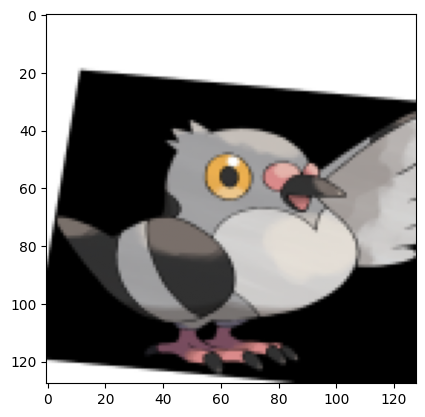

In [3]:
plt.imshow(x_train[98])

In [4]:
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.layers import Input, Conv2D, Flatten, Dense, Reshape, Conv2DTranspose, Lambda, Flatten
from tensorflow.keras.models import Sequential
import numpy as np

LATENT_DIM = 256  # Dimensionality of the latent space
IMAGE_SIZE = 128

# Encoder
encoder_input = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
x = Conv2D(32, 3, activation="relu", strides=2, padding="same")(encoder_input)
x = Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
x = Conv2D(128, 3, activation="relu", strides=2, padding="same")(x)
x = Conv2D(256, 3, activation="relu", strides=2, padding="same")(x)
x = Flatten()(x)
x = Dense(512, activation="relu")(x)

z_mean = Dense(LATENT_DIM, name="z_mean")(x)
z_log_var = Dense(LATENT_DIM, name="z_log_var")(x)

# Sampling function
def sampling(args):
    z_mean, z_log_var = args
    epsilon = tf.random.normal(shape=(tf.shape(z_mean)[0], LATENT_DIM))
    return z_mean + tf.exp(0.5 * z_log_var) * epsilon

z = Lambda(sampling, output_shape=(LATENT_DIM,), name="z")([z_mean, z_log_var])

encoder = Model(encoder_input, [z_mean, z_log_var, z], name="encoder")

# Decoder
decoder_input = Input(shape=(LATENT_DIM,))
x = Dense(512, activation="relu")(decoder_input)
x = Dense(8 * 8 * 256, activation="relu")(x)
x = Reshape((8, 8, 256))(x)
x = Conv2DTranspose(128, 3, activation="relu", strides=2, padding="same")(x)
x = Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x)
x = Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
x = Conv2DTranspose(16, 3, activation="relu", strides=2, padding="same")(x)
decoder_output = Conv2DTranspose(3, 3, activation="sigmoid", padding="same")(x)

decoder = Model(decoder_input, decoder_output, name="decoder")

# VAE
vae_output = decoder(encoder(encoder_input)[2])
vae = Model(encoder_input, vae_output, name="vae")

print(encoder.summary())
print(decoder.summary())
print(vae.summary())

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 64, 64, 32)   896         ['input_1[0][0]']                
                                                                                                  
 conv2d_1 (Conv2D)              (None, 32, 32, 64)   18496       ['conv2d[0][0]']                 
                                                                                                  
 conv2d_2 (Conv2D)              (None, 16, 16, 128)  73856       ['conv2d_1[0][0]']         

In [5]:
# Loss
reconstruction_loss = tf.reduce_mean(tf.keras.losses.binary_crossentropy(encoder_input, vae_output))
reconstruction_loss *= IMAGE_SIZE * IMAGE_SIZE
kl_loss = -0.5 * tf.reduce_sum(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var), axis=-1)
vae_loss = tf.reduce_mean(reconstruction_loss + kl_loss)

# Compile
vae.add_loss(vae_loss)

lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-3,
    decay_steps=10000,
    decay_rate=0.97)

optimizer = keras.optimizers.Adam(learning_rate=lr_schedule)
vae.compile(optimizer = optimizer)

In [6]:
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import Callback

class PlotReconstructedImages(Callback):
    def __init__(self, x_val, interval=20):
        super().__init__()
        self.x_val = x_val
        self.interval = interval

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.interval == 0:
            reconstructed_images = self.model.predict(self.x_val)
            self.plot_images(reconstructed_images)

    def plot_images(self, reconstructed_images):
        n = 10
        plt.figure(figsize=(20, 4))

        for i in range(n):
            # Display original images
            ax = plt.subplot(2, n, i + 1)
            plt.imshow(self.x_val[i].reshape(IMAGE_SIZE, IMAGE_SIZE, 3), cmap='gray')
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

            # Display reconstructed images
            ax = plt.subplot(2, n, i + 1 + n)
            plt.imshow(reconstructed_images[i].reshape(IMAGE_SIZE, IMAGE_SIZE, 3), cmap='gray')
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

        plt.show()

plot_callback = PlotReconstructedImages(x_train, interval=20)

Epoch 1/500
4/4 [==============================] - 11s 529ms/step - loss: 11335.1758 - val_loss: 11224.9561
Epoch 2/500
4/4 [==============================] - 0s 61ms/step - loss: 11125.2412 - val_loss: 10865.1162
Epoch 3/500
4/4 [==============================] - 0s 58ms/step - loss: 10788.2324 - val_loss: 10640.6523
Epoch 4/500
4/4 [==============================] - 0s 58ms/step - loss: 10614.5449 - val_loss: 10487.1514
Epoch 5/500
4/4 [==============================] - 0s 61ms/step - loss: 10487.8652 - val_loss: 10398.2168
Epoch 6/500
4/4 [==============================] - 0s 58ms/step - loss: 10416.8857 - val_loss: 10538.2959
Epoch 7/500
4/4 [==============================] - 0s 62ms/step - loss: 10427.5566 - val_loss: 10358.5166
Epoch 8/500
4/4 [==============================] - 0s 62ms/step - loss: 10351.8135 - val_loss: 10312.5361
Epoch 9/500
4/4 [==============================] - 0s 60ms/step - loss: 10238.8203 - val_loss: 10155.7217
Epoch 10/500
4/4 [==========================

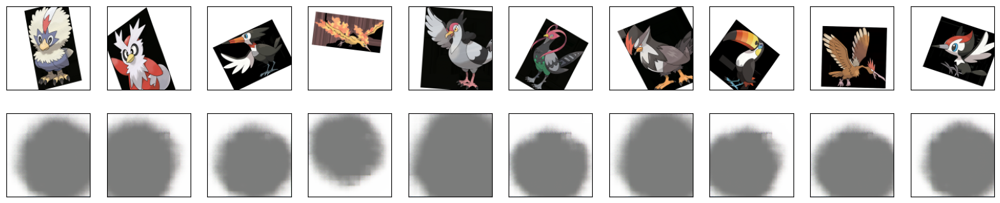

4/4 [==============================] - 2s 684ms/step - loss: 8667.6328 - val_loss: 8596.8799
Epoch 21/500
4/4 [==============================] - 0s 61ms/step - loss: 8633.7344 - val_loss: 8600.5078
Epoch 22/500
4/4 [==============================] - 0s 62ms/step - loss: 8608.1943 - val_loss: 8499.7061
Epoch 23/500
4/4 [==============================] - 0s 59ms/step - loss: 8531.2686 - val_loss: 8443.4414
Epoch 24/500
4/4 [==============================] - 0s 63ms/step - loss: 8474.3340 - val_loss: 8412.5342
Epoch 25/500
4/4 [==============================] - 0s 59ms/step - loss: 8484.2725 - val_loss: 8370.1680
Epoch 26/500
4/4 [==============================] - 0s 59ms/step - loss: 8445.8203 - val_loss: 8380.2236
Epoch 27/500
4/4 [==============================] - 0s 61ms/step - loss: 8399.5508 - val_loss: 8359.9863
Epoch 28/500
4/4 [==============================] - 0s 58ms/step - loss: 8406.8164 - val_loss: 8376.2236
Epoch 29/500
4/4 [==============================] - 0s 59ms/step - 

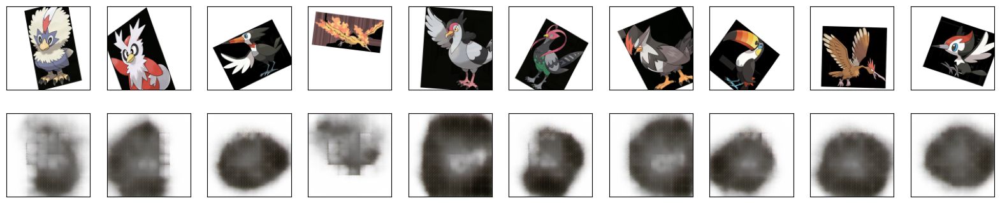

4/4 [==============================] - 1s 436ms/step - loss: 7283.2344 - val_loss: 7270.0933
Epoch 41/500
4/4 [==============================] - 0s 59ms/step - loss: 7164.2529 - val_loss: 7147.1670
Epoch 42/500
4/4 [==============================] - 0s 61ms/step - loss: 7074.9980 - val_loss: 7173.3076
Epoch 43/500
4/4 [==============================] - 0s 58ms/step - loss: 7018.3560 - val_loss: 7027.2139
Epoch 44/500
4/4 [==============================] - 0s 58ms/step - loss: 6901.0557 - val_loss: 7016.8955
Epoch 45/500
4/4 [==============================] - 0s 61ms/step - loss: 6839.5439 - val_loss: 6886.4546
Epoch 46/500
4/4 [==============================] - 0s 60ms/step - loss: 6735.6445 - val_loss: 6793.4233
Epoch 47/500
4/4 [==============================] - 0s 60ms/step - loss: 6604.5835 - val_loss: 6708.8818
Epoch 48/500
4/4 [==============================] - 0s 63ms/step - loss: 6506.0659 - val_loss: 6667.4043
Epoch 49/500
4/4 [==============================] - 0s 60ms/step - 

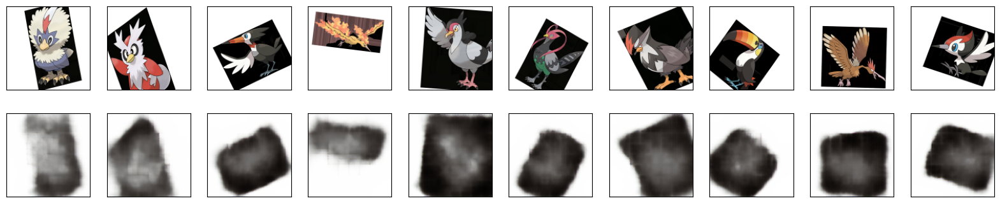

4/4 [==============================] - 2s 509ms/step - loss: 5892.9971 - val_loss: 6095.8311
Epoch 61/500
4/4 [==============================] - 0s 62ms/step - loss: 5858.4692 - val_loss: 6065.6201
Epoch 62/500
4/4 [==============================] - 0s 61ms/step - loss: 5789.5073 - val_loss: 6031.4248
Epoch 63/500
4/4 [==============================] - 0s 61ms/step - loss: 5761.4482 - val_loss: 6006.4663
Epoch 64/500
4/4 [==============================] - 0s 59ms/step - loss: 5755.9644 - val_loss: 6043.6245
Epoch 65/500
4/4 [==============================] - 0s 59ms/step - loss: 5724.6758 - val_loss: 5983.1294
Epoch 66/500
4/4 [==============================] - 0s 59ms/step - loss: 5728.0273 - val_loss: 5989.5630
Epoch 67/500
4/4 [==============================] - 0s 59ms/step - loss: 5654.1631 - val_loss: 5939.6299
Epoch 68/500
4/4 [==============================] - 0s 59ms/step - loss: 5590.3408 - val_loss: 5905.8281
Epoch 69/500
4/4 [==============================] - 0s 59ms/step - 

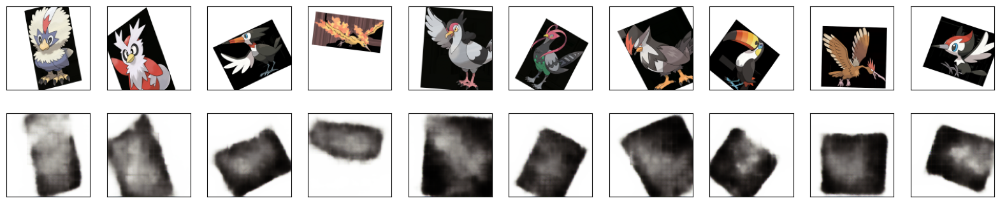

4/4 [==============================] - 1s 427ms/step - loss: 5282.8218 - val_loss: 5811.2163
Epoch 81/500
4/4 [==============================] - 0s 59ms/step - loss: 5233.5449 - val_loss: 5840.7329
Epoch 82/500
4/4 [==============================] - 0s 65ms/step - loss: 5217.0059 - val_loss: 5834.9233
Epoch 83/500
4/4 [==============================] - 0s 64ms/step - loss: 5179.6035 - val_loss: 5757.0264
Epoch 84/500
4/4 [==============================] - 0s 59ms/step - loss: 5142.7842 - val_loss: 5765.4512
Epoch 85/500
4/4 [==============================] - 0s 58ms/step - loss: 5132.9082 - val_loss: 5778.1138
Epoch 86/500
4/4 [==============================] - 0s 58ms/step - loss: 5153.7705 - val_loss: 5732.8594
Epoch 87/500
4/4 [==============================] - 0s 62ms/step - loss: 5161.7959 - val_loss: 5767.9292
Epoch 88/500
4/4 [==============================] - 0s 60ms/step - loss: 5096.6738 - val_loss: 5799.9214
Epoch 89/500
4/4 [==============================] - 0s 61ms/step - 

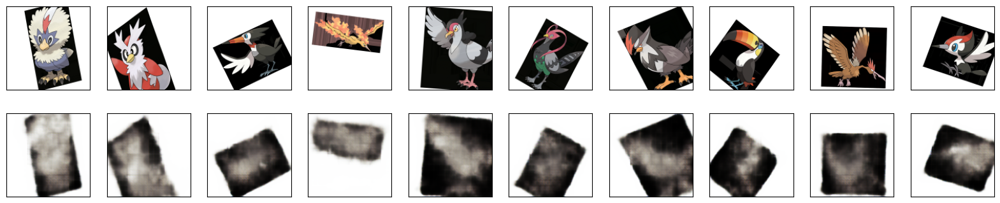

4/4 [==============================] - 1s 430ms/step - loss: 4877.2646 - val_loss: 5915.8218
Epoch 101/500
4/4 [==============================] - 0s 60ms/step - loss: 4918.3071 - val_loss: 5792.8462
Epoch 102/500
4/4 [==============================] - 0s 58ms/step - loss: 4897.0420 - val_loss: 5859.4819
Epoch 103/500
4/4 [==============================] - 0s 60ms/step - loss: 4862.3926 - val_loss: 5795.2549
Epoch 104/500
4/4 [==============================] - 0s 59ms/step - loss: 4861.3369 - val_loss: 5855.5220
Epoch 105/500
4/4 [==============================] - 0s 60ms/step - loss: 4843.2935 - val_loss: 5852.0176
Epoch 106/500
4/4 [==============================] - 0s 61ms/step - loss: 4798.1787 - val_loss: 5833.9902
Epoch 107/500
4/4 [==============================] - 0s 60ms/step - loss: 4787.2529 - val_loss: 5819.2017
Epoch 108/500
4/4 [==============================] - 0s 62ms/step - loss: 4751.4224 - val_loss: 5812.1050
Epoch 109/500
4/4 [==============================] - 0s 59m

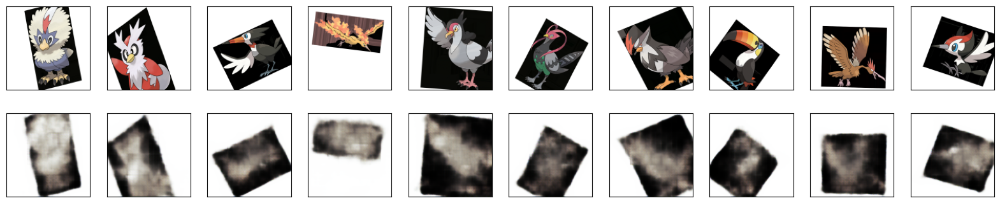

4/4 [==============================] - 1s 450ms/step - loss: 4717.0840 - val_loss: 5987.1831
Epoch 121/500
4/4 [==============================] - 0s 59ms/step - loss: 4693.7485 - val_loss: 5945.4624
Epoch 122/500
4/4 [==============================] - 0s 60ms/step - loss: 4653.6035 - val_loss: 5899.6519
Epoch 123/500
4/4 [==============================] - 0s 58ms/step - loss: 4641.0620 - val_loss: 5878.4526
Epoch 124/500
4/4 [==============================] - 0s 63ms/step - loss: 4647.4976 - val_loss: 5976.7812
Epoch 125/500
4/4 [==============================] - 0s 63ms/step - loss: 4631.9404 - val_loss: 5874.7964
Epoch 126/500
4/4 [==============================] - 0s 62ms/step - loss: 4613.5044 - val_loss: 5921.3374
Epoch 127/500
4/4 [==============================] - 0s 58ms/step - loss: 4625.0337 - val_loss: 5989.0698
Epoch 128/500
4/4 [==============================] - 0s 58ms/step - loss: 4610.8970 - val_loss: 5993.0454
Epoch 129/500
4/4 [==============================] - 0s 64m

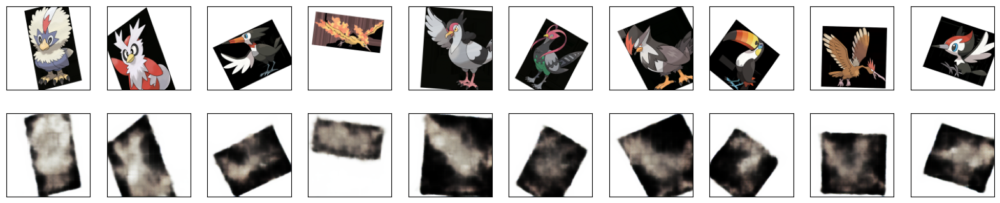

4/4 [==============================] - 2s 509ms/step - loss: 4504.1279 - val_loss: 6029.4688
Epoch 141/500
4/4 [==============================] - 0s 60ms/step - loss: 4519.9707 - val_loss: 6060.3809
Epoch 142/500
4/4 [==============================] - 0s 59ms/step - loss: 4523.1157 - val_loss: 6075.4775
Epoch 143/500
4/4 [==============================] - 0s 60ms/step - loss: 4527.1318 - val_loss: 6067.1533
Epoch 144/500
4/4 [==============================] - 0s 58ms/step - loss: 4514.1206 - val_loss: 6034.7725
Epoch 145/500
4/4 [==============================] - 0s 63ms/step - loss: 4507.4634 - val_loss: 6099.4434
Epoch 146/500
4/4 [==============================] - 0s 61ms/step - loss: 4505.8682 - val_loss: 6077.1963
Epoch 147/500
4/4 [==============================] - 0s 59ms/step - loss: 4485.7061 - val_loss: 6050.0376
Epoch 148/500
4/4 [==============================] - 0s 61ms/step - loss: 4474.6616 - val_loss: 6065.5723
Epoch 149/500
4/4 [==============================] - 0s 59m

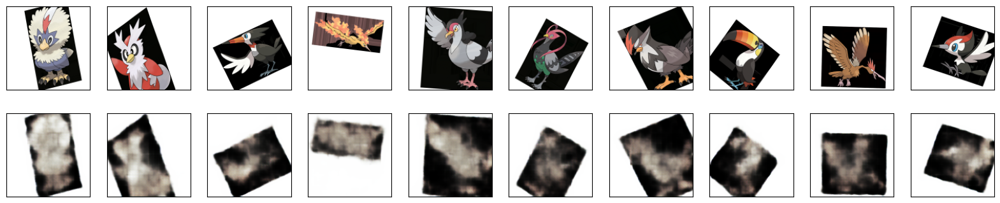

4/4 [==============================] - 1s 420ms/step - loss: 4398.3794 - val_loss: 6190.6494
Epoch 161/500
4/4 [==============================] - 0s 59ms/step - loss: 4394.2944 - val_loss: 6158.9331
Epoch 162/500
4/4 [==============================] - 0s 58ms/step - loss: 4397.8418 - val_loss: 6147.3877
Epoch 163/500
4/4 [==============================] - 0s 59ms/step - loss: 4388.2803 - val_loss: 6173.1367
Epoch 164/500
4/4 [==============================] - 0s 59ms/step - loss: 4393.2676 - val_loss: 6192.2686
Epoch 165/500
4/4 [==============================] - 0s 59ms/step - loss: 4375.2949 - val_loss: 6199.1973
Epoch 166/500
4/4 [==============================] - 0s 59ms/step - loss: 4357.1978 - val_loss: 6261.0225
Epoch 167/500
4/4 [==============================] - 0s 61ms/step - loss: 4369.0181 - val_loss: 6174.4370
Epoch 168/500
4/4 [==============================] - 0s 59ms/step - loss: 4387.9429 - val_loss: 6177.4502
Epoch 169/500
4/4 [==============================] - 0s 63m

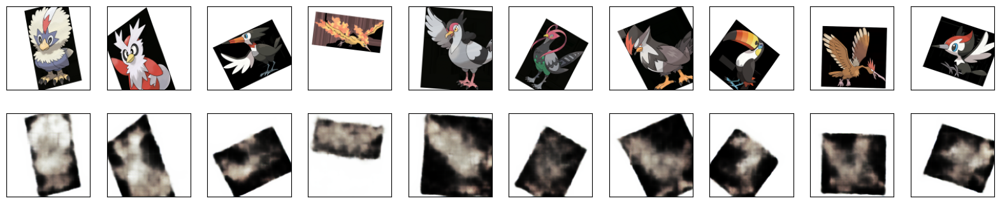

4/4 [==============================] - 1s 426ms/step - loss: 4351.1636 - val_loss: 6233.0371
Epoch 181/500
4/4 [==============================] - 0s 69ms/step - loss: 4332.0879 - val_loss: 6264.1455
Epoch 182/500
4/4 [==============================] - 0s 59ms/step - loss: 4321.0537 - val_loss: 6240.6992
Epoch 183/500
4/4 [==============================] - 0s 59ms/step - loss: 4316.0576 - val_loss: 6214.5874
Epoch 184/500
4/4 [==============================] - 0s 61ms/step - loss: 4314.0039 - val_loss: 6273.0708
Epoch 185/500
4/4 [==============================] - 0s 63ms/step - loss: 4310.9351 - val_loss: 6252.1504
Epoch 186/500
4/4 [==============================] - 0s 58ms/step - loss: 4281.7495 - val_loss: 6365.3096
Epoch 187/500
4/4 [==============================] - 0s 61ms/step - loss: 4286.1250 - val_loss: 6229.2651
Epoch 188/500
4/4 [==============================] - 0s 60ms/step - loss: 4281.0439 - val_loss: 6256.1611
Epoch 189/500
4/4 [==============================] - 0s 59m

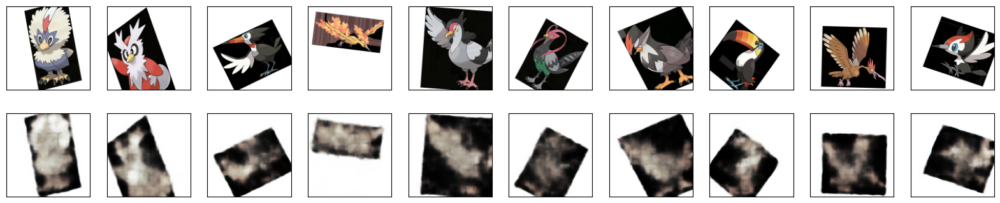

4/4 [==============================] - 2s 502ms/step - loss: 4284.5078 - val_loss: 6458.2349
Epoch 201/500
4/4 [==============================] - 0s 64ms/step - loss: 4293.5322 - val_loss: 6399.8652
Epoch 202/500
4/4 [==============================] - 0s 59ms/step - loss: 4287.3125 - val_loss: 6354.4048
Epoch 203/500
4/4 [==============================] - 0s 58ms/step - loss: 4272.4180 - val_loss: 6330.8843
Epoch 204/500
4/4 [==============================] - 0s 59ms/step - loss: 4254.8330 - val_loss: 6294.6689
Epoch 205/500
4/4 [==============================] - 0s 59ms/step - loss: 4240.2280 - val_loss: 6291.1538
Epoch 206/500
4/4 [==============================] - 0s 61ms/step - loss: 4243.5825 - val_loss: 6375.1880
Epoch 207/500
4/4 [==============================] - 0s 60ms/step - loss: 4230.8335 - val_loss: 6353.4194
Epoch 208/500
4/4 [==============================] - 0s 62ms/step - loss: 4238.2129 - val_loss: 6388.3286
Epoch 209/500
4/4 [==============================] - 0s 60m

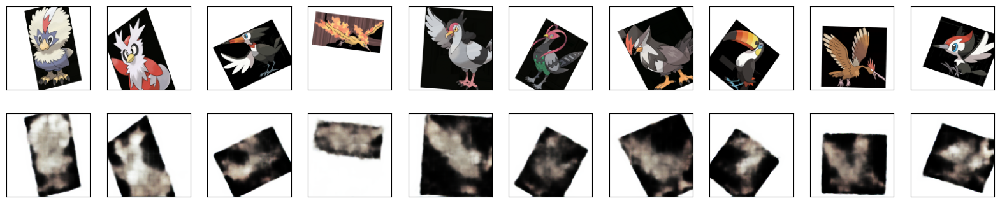

4/4 [==============================] - 1s 420ms/step - loss: 4216.4907 - val_loss: 6439.6587
Epoch 221/500
4/4 [==============================] - 0s 61ms/step - loss: 4202.0317 - val_loss: 6432.2700
Epoch 222/500
4/4 [==============================] - 0s 60ms/step - loss: 4183.8823 - val_loss: 6405.4702
Epoch 223/500
4/4 [==============================] - 0s 58ms/step - loss: 4200.0068 - val_loss: 6428.8149
Epoch 224/500
4/4 [==============================] - 0s 60ms/step - loss: 4180.8125 - val_loss: 6461.7964
Epoch 225/500
4/4 [==============================] - 0s 59ms/step - loss: 4200.8994 - val_loss: 6450.3906
Epoch 226/500
4/4 [==============================] - 0s 61ms/step - loss: 4190.0078 - val_loss: 6441.4380
Epoch 227/500
4/4 [==============================] - 0s 59ms/step - loss: 4190.1558 - val_loss: 6324.6030
Epoch 228/500
4/4 [==============================] - 0s 59ms/step - loss: 4184.2959 - val_loss: 6447.9619
Epoch 229/500
4/4 [==============================] - 0s 59m

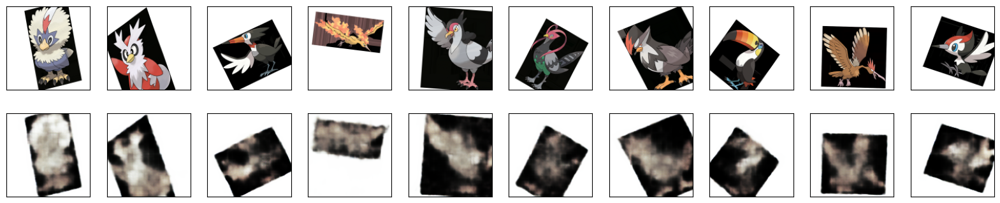

4/4 [==============================] - 1s 421ms/step - loss: 4186.7080 - val_loss: 6464.4785
Epoch 241/500
4/4 [==============================] - 0s 58ms/step - loss: 4168.7466 - val_loss: 6493.4863
Epoch 242/500
4/4 [==============================] - 0s 61ms/step - loss: 4165.6357 - val_loss: 6474.0229
Epoch 243/500
4/4 [==============================] - 0s 61ms/step - loss: 4162.0566 - val_loss: 6525.8887
Epoch 244/500
4/4 [==============================] - 0s 60ms/step - loss: 4144.8804 - val_loss: 6504.3789
Epoch 245/500
4/4 [==============================] - 0s 59ms/step - loss: 4135.4917 - val_loss: 6510.5513
Epoch 246/500
4/4 [==============================] - 0s 60ms/step - loss: 4146.3164 - val_loss: 6468.8687
Epoch 247/500
4/4 [==============================] - 0s 59ms/step - loss: 4132.5083 - val_loss: 6472.0605
Epoch 248/500
4/4 [==============================] - 0s 62ms/step - loss: 4119.4263 - val_loss: 6477.1719
Epoch 249/500
4/4 [==============================] - 0s 60m

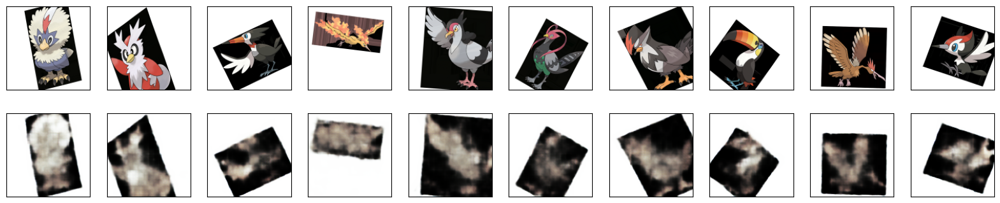

4/4 [==============================] - 1s 422ms/step - loss: 4118.0957 - val_loss: 6616.8442
Epoch 261/500
4/4 [==============================] - 0s 59ms/step - loss: 4107.8115 - val_loss: 6575.4404
Epoch 262/500
4/4 [==============================] - 0s 58ms/step - loss: 4105.5552 - val_loss: 6528.8608
Epoch 263/500
4/4 [==============================] - 0s 61ms/step - loss: 4106.9678 - val_loss: 6632.9985
Epoch 264/500
4/4 [==============================] - 0s 61ms/step - loss: 4110.0269 - val_loss: 6598.5850
Epoch 265/500
4/4 [==============================] - 0s 62ms/step - loss: 4169.6558 - val_loss: 6543.1992
Epoch 266/500
4/4 [==============================] - 0s 60ms/step - loss: 4111.8291 - val_loss: 6586.1602
Epoch 267/500
4/4 [==============================] - 0s 60ms/step - loss: 4137.7217 - val_loss: 6609.7051
Epoch 268/500
4/4 [==============================] - 0s 59ms/step - loss: 4122.3213 - val_loss: 6525.8545
Epoch 269/500
4/4 [==============================] - 0s 59m

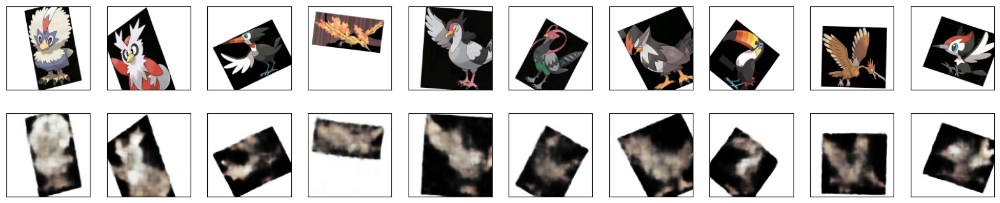

4/4 [==============================] - 2s 508ms/step - loss: 4102.8486 - val_loss: 6736.2817
Epoch 281/500
4/4 [==============================] - 0s 59ms/step - loss: 4076.9092 - val_loss: 6640.5161
Epoch 282/500
4/4 [==============================] - 0s 59ms/step - loss: 4071.2939 - val_loss: 6691.5220
Epoch 283/500
4/4 [==============================] - 0s 62ms/step - loss: 4081.5769 - val_loss: 6623.9951
Epoch 284/500
4/4 [==============================] - 0s 60ms/step - loss: 4065.4741 - val_loss: 6658.1714
Epoch 285/500
4/4 [==============================] - 0s 58ms/step - loss: 4062.8149 - val_loss: 6674.2363
Epoch 286/500
4/4 [==============================] - 0s 58ms/step - loss: 4051.2034 - val_loss: 6634.5962
Epoch 287/500
4/4 [==============================] - 0s 59ms/step - loss: 4056.9617 - val_loss: 6697.9307
Epoch 288/500
4/4 [==============================] - 0s 60ms/step - loss: 4055.5698 - val_loss: 6698.1538
Epoch 289/500
4/4 [==============================] - 0s 59m

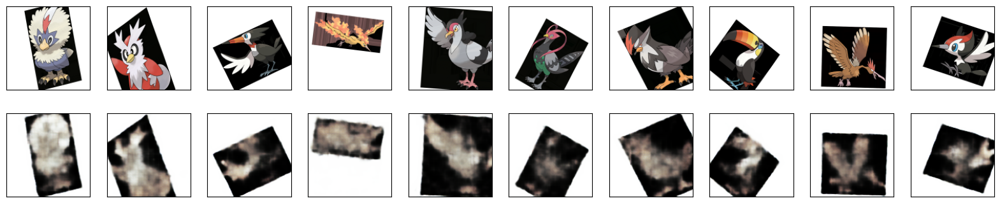

4/4 [==============================] - 1s 420ms/step - loss: 4067.9863 - val_loss: 6721.7495
Epoch 301/500
4/4 [==============================] - 0s 58ms/step - loss: 4064.9619 - val_loss: 6651.8545
Epoch 302/500
4/4 [==============================] - 0s 58ms/step - loss: 4058.1394 - val_loss: 6664.0996
Epoch 303/500
4/4 [==============================] - 0s 59ms/step - loss: 4045.8645 - val_loss: 6730.1465
Epoch 304/500
4/4 [==============================] - 0s 58ms/step - loss: 4047.9670 - val_loss: 6678.5913
Epoch 305/500
4/4 [==============================] - 0s 60ms/step - loss: 4031.9639 - val_loss: 6721.3818
Epoch 306/500
4/4 [==============================] - 0s 58ms/step - loss: 4026.0649 - val_loss: 6669.8569
Epoch 307/500
4/4 [==============================] - 0s 62ms/step - loss: 4042.1411 - val_loss: 6739.9736
Epoch 308/500
4/4 [==============================] - 0s 61ms/step - loss: 4032.1162 - val_loss: 6709.2695
Epoch 309/500
4/4 [==============================] - 0s 61m

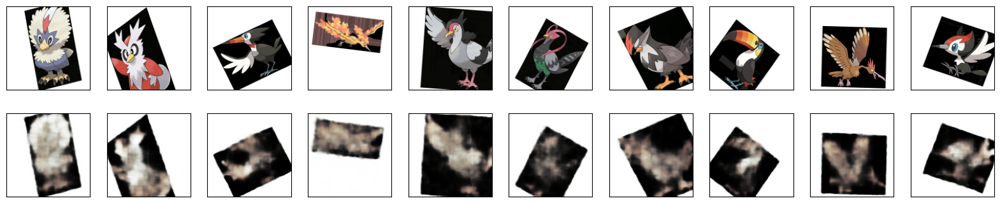

4/4 [==============================] - 1s 427ms/step - loss: 4051.9292 - val_loss: 6801.6802
Epoch 321/500
4/4 [==============================] - 0s 61ms/step - loss: 4032.8135 - val_loss: 6786.4819
Epoch 322/500
4/4 [==============================] - 0s 60ms/step - loss: 4023.5586 - val_loss: 6797.1704
Epoch 323/500
4/4 [==============================] - 0s 66ms/step - loss: 4020.8972 - val_loss: 6809.0483
Epoch 324/500
4/4 [==============================] - 0s 68ms/step - loss: 4024.5811 - val_loss: 6783.2183
Epoch 325/500
4/4 [==============================] - 0s 62ms/step - loss: 4009.9121 - val_loss: 6791.8721
Epoch 326/500
4/4 [==============================] - 0s 59ms/step - loss: 4007.5105 - val_loss: 6832.9043
Epoch 327/500
4/4 [==============================] - 0s 59ms/step - loss: 3998.5984 - val_loss: 6768.1143
Epoch 328/500
4/4 [==============================] - 0s 65ms/step - loss: 3992.0664 - val_loss: 6676.9214
Epoch 329/500
4/4 [==============================] - 0s 58m

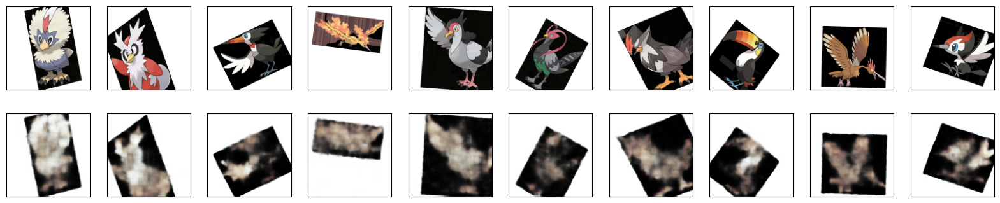

4/4 [==============================] - 2s 508ms/step - loss: 3970.4473 - val_loss: 6788.3882
Epoch 341/500
4/4 [==============================] - 0s 58ms/step - loss: 3974.4023 - val_loss: 6862.5850
Epoch 342/500
4/4 [==============================] - 0s 63ms/step - loss: 3971.9482 - val_loss: 6856.8193
Epoch 343/500
4/4 [==============================] - 0s 59ms/step - loss: 3977.7944 - val_loss: 6884.5024
Epoch 344/500
4/4 [==============================] - 0s 61ms/step - loss: 3986.2944 - val_loss: 6885.0288
Epoch 345/500
4/4 [==============================] - 0s 59ms/step - loss: 3985.0913 - val_loss: 6919.5811
Epoch 346/500
4/4 [==============================] - 0s 61ms/step - loss: 3973.1177 - val_loss: 6875.8208
Epoch 347/500
4/4 [==============================] - 0s 59ms/step - loss: 3959.6694 - val_loss: 6823.5024
Epoch 348/500
4/4 [==============================] - 0s 59ms/step - loss: 3969.7515 - val_loss: 6824.9380
Epoch 349/500
4/4 [==============================] - 0s 58m

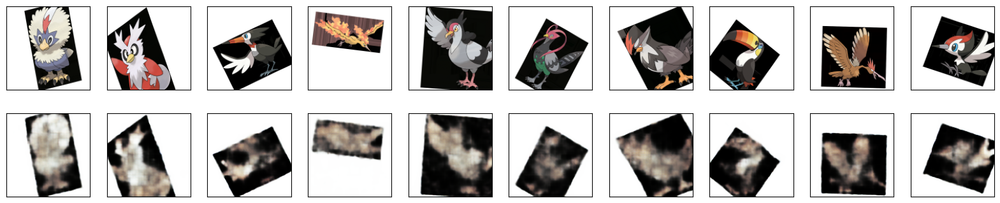

4/4 [==============================] - 1s 427ms/step - loss: 3966.2427 - val_loss: 6860.8511
Epoch 361/500
4/4 [==============================] - 0s 61ms/step - loss: 3973.5571 - val_loss: 6949.9512
Epoch 362/500
4/4 [==============================] - 0s 61ms/step - loss: 3987.1785 - val_loss: 6894.6465
Epoch 363/500
4/4 [==============================] - 0s 60ms/step - loss: 3979.7383 - val_loss: 6887.0005
Epoch 364/500
4/4 [==============================] - 0s 62ms/step - loss: 3983.5618 - val_loss: 6848.7539
Epoch 365/500
4/4 [==============================] - 0s 61ms/step - loss: 3961.2422 - val_loss: 6957.5869
Epoch 366/500
4/4 [==============================] - 0s 61ms/step - loss: 3978.6104 - val_loss: 6933.8550
Epoch 367/500
4/4 [==============================] - 0s 59ms/step - loss: 3972.9973 - val_loss: 6854.0557
Epoch 368/500
4/4 [==============================] - 0s 59ms/step - loss: 3970.0234 - val_loss: 6862.4346
Epoch 369/500
4/4 [==============================] - 0s 59m

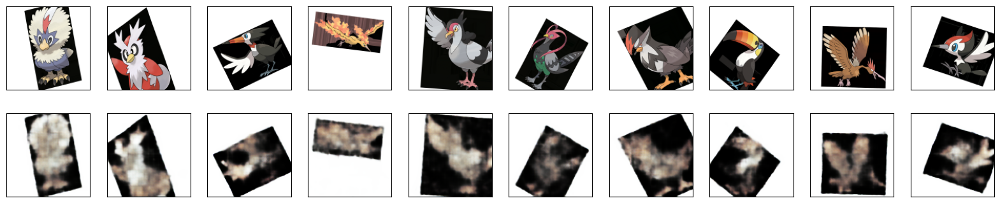

4/4 [==============================] - 1s 436ms/step - loss: 3919.6062 - val_loss: 6853.2910
Epoch 381/500
4/4 [==============================] - 0s 59ms/step - loss: 3912.7861 - val_loss: 6821.8862
Epoch 382/500
4/4 [==============================] - 0s 59ms/step - loss: 3940.8091 - val_loss: 6794.2812
Epoch 383/500
4/4 [==============================] - 0s 59ms/step - loss: 3933.1328 - val_loss: 6899.1230
Epoch 384/500
4/4 [==============================] - 0s 58ms/step - loss: 3934.9480 - val_loss: 6955.6958
Epoch 385/500
4/4 [==============================] - 0s 59ms/step - loss: 3936.7512 - val_loss: 6896.1343
Epoch 386/500
4/4 [==============================] - 0s 58ms/step - loss: 3929.6113 - val_loss: 6944.6914
Epoch 387/500
4/4 [==============================] - 0s 58ms/step - loss: 3943.2524 - val_loss: 6922.6279
Epoch 388/500
4/4 [==============================] - 0s 58ms/step - loss: 3944.2610 - val_loss: 6898.4619
Epoch 389/500
4/4 [==============================] - 0s 59m

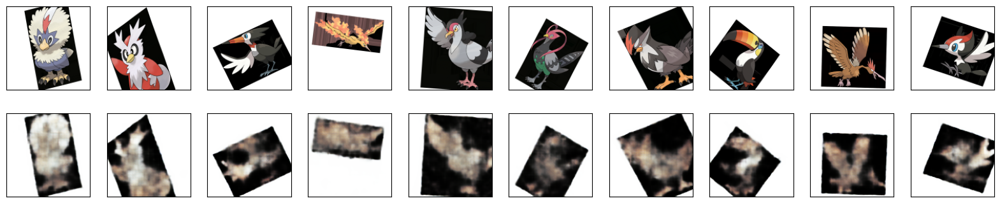

4/4 [==============================] - 2s 498ms/step - loss: 3924.7585 - val_loss: 6903.0337
Epoch 401/500
4/4 [==============================] - 0s 60ms/step - loss: 3907.2080 - val_loss: 7009.9370
Epoch 402/500
4/4 [==============================] - 0s 59ms/step - loss: 3912.5540 - val_loss: 6936.1519
Epoch 403/500
4/4 [==============================] - 0s 61ms/step - loss: 3908.8064 - val_loss: 6930.9175
Epoch 404/500
4/4 [==============================] - 0s 60ms/step - loss: 3912.8640 - val_loss: 6926.5962
Epoch 405/500
4/4 [==============================] - 0s 59ms/step - loss: 3911.7561 - val_loss: 6934.6187
Epoch 406/500
4/4 [==============================] - 0s 59ms/step - loss: 3905.3745 - val_loss: 6967.2939
Epoch 407/500
4/4 [==============================] - 0s 59ms/step - loss: 3919.6147 - val_loss: 6982.2505
Epoch 408/500
4/4 [==============================] - 0s 59ms/step - loss: 3923.1631 - val_loss: 6823.0293
Epoch 409/500
4/4 [==============================] - 0s 63m

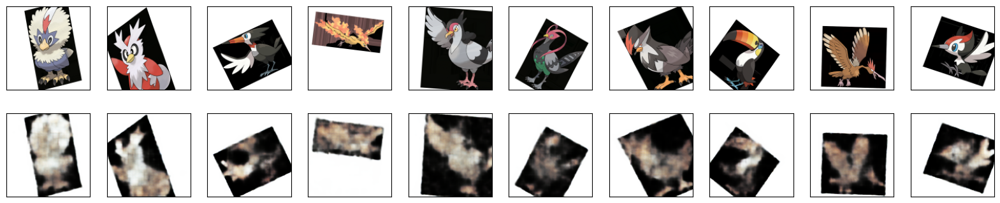

4/4 [==============================] - 1s 423ms/step - loss: 3892.0256 - val_loss: 7055.3638
Epoch 421/500
4/4 [==============================] - 0s 61ms/step - loss: 3886.4263 - val_loss: 7041.2729
Epoch 422/500
4/4 [==============================] - 0s 61ms/step - loss: 3903.8660 - val_loss: 7101.5811
Epoch 423/500
4/4 [==============================] - 0s 58ms/step - loss: 3881.9163 - val_loss: 7026.1782
Epoch 424/500
4/4 [==============================] - 0s 58ms/step - loss: 3886.2983 - val_loss: 6964.0713
Epoch 425/500
4/4 [==============================] - 0s 59ms/step - loss: 3898.4561 - val_loss: 7068.0879
Epoch 426/500
4/4 [==============================] - 0s 63ms/step - loss: 3901.3855 - val_loss: 7087.9019
Epoch 427/500
4/4 [==============================] - 0s 60ms/step - loss: 3886.8389 - val_loss: 7008.7114
Epoch 428/500
4/4 [==============================] - 0s 65ms/step - loss: 3886.7458 - val_loss: 7039.9019
Epoch 429/500
4/4 [==============================] - 0s 62m

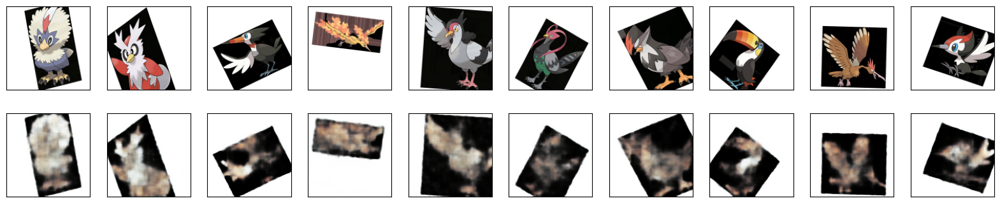

4/4 [==============================] - 1s 428ms/step - loss: 3877.4824 - val_loss: 7036.8794
Epoch 441/500
4/4 [==============================] - 0s 61ms/step - loss: 3881.2246 - val_loss: 7106.8750
Epoch 442/500
4/4 [==============================] - 0s 59ms/step - loss: 3882.5825 - val_loss: 7071.9736
Epoch 443/500
4/4 [==============================] - 0s 59ms/step - loss: 3870.0642 - val_loss: 7076.6768
Epoch 444/500
4/4 [==============================] - 0s 63ms/step - loss: 3866.6636 - val_loss: 7097.2339
Epoch 445/500
4/4 [==============================] - 0s 59ms/step - loss: 3861.1768 - val_loss: 7034.9419
Epoch 446/500
4/4 [==============================] - 0s 59ms/step - loss: 3846.1689 - val_loss: 7083.5830
Epoch 447/500
4/4 [==============================] - 0s 59ms/step - loss: 3864.0564 - val_loss: 7120.5762
Epoch 448/500
4/4 [==============================] - 0s 59ms/step - loss: 3863.5576 - val_loss: 7120.0649
Epoch 449/500
4/4 [==============================] - 0s 61m

In [ ]:
epochs = 500
batch_size = 256
vae.fit(x_train, x_train, epochs=epochs, batch_size=batch_size, validation_data=(x_val, x_val),callbacks=[plot_callback])

In [ ]:
decoder.save('/content/drive/My Drive/2023_spring/DS340/DS340_GroupProject/decoder_model_bied.h5')

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt

# Load the decoder model
decoder = load_model('/content/drive/My Drive/2023_spring/DS340/DS340_GroupProject/decoder_model_bied.h5')

# Sampling function
def sampling(z_mean, z_log_var):
    epsilon = tf.random.normal(shape=(tf.shape(z_mean)[0], LATENT_DIM), dtype=tf.double)
    return z_mean + tf.exp(0.5 * z_log_var) * epsilon

# Generate a random z_mean and z_log_var for demonstration
z_mean_example = np.random.normal(0, 1, (1, LATENT_DIM))
z_log_var_example = np.random.normal(0, 1, (1, LATENT_DIM))

# Obtain a sample from the latent space
z_sample = sampling(z_mean_example, z_log_var_example)

# Generate an image using the decoder
generated_image = decoder.predict(z_sample)

# Display the generated image
plt.imshow(generated_image[0])
plt.show()